In [1]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Create directory structure
import os

base_dir = '/content/drive/MyDrive/VAE_ChestXray'
dirs = ['data', 'checkpoints', 'results', 'generated_images']

for dir_name in dirs:
    os.makedirs(os.path.join(base_dir, dir_name), exist_ok=True)

print(f"Working directory: {base_dir}")

Mounted at /content/drive
Working directory: /content/drive/MyDrive/VAE_ChestXray


In [2]:
# Install required libraries
!pip install -q pytorch-ignite
!pip install -q kaggle

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 343.8/343.8 kB 32.1 MB/s eta 0:00:00


In [3]:
# Import all required libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import save_image, make_grid

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
import glob
from pathlib import Path

from ignite.metrics import FID, InceptionScore

# Check GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Using device: cuda
GPU: Tesla T4


In [4]:
# Set random seeds for reproducibility
def set_seed(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [5]:
# Step 3: Download and Organize Dataset (with progress and checks)

from google.colab import files
import zipfile
from tqdm import tqdm

# Upload kaggle.json
print("Upload your kaggle.json file:")
uploaded = files.upload()

# Setup Kaggle API
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download dataset
data_dir = os.path.join(base_dir, 'data')
dataset_path = os.path.join(data_dir, 'chest_xray')

# Check if dataset is already extracted
if os.path.exists(dataset_path) and len(os.listdir(dataset_path)) > 0:
    print(f"Dataset already extracted at {dataset_path}")
else:
    # Download if not present
    zip_path = os.path.join(data_dir, 'chest-xray-pneumonia.zip')

    if not os.path.exists(zip_path):
        print("Downloading dataset...")
        !kaggle datasets download -d paultimothymooney/chest-xray-pneumonia -p {data_dir}
    else:
        print("Dataset zip file already exists, skipping download...")

    # Extract with progress
    print("Extracting dataset (this may take 2-3 minutes)...")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        members = zip_ref.namelist()
        for member in tqdm(members, desc="Extracting"):
            zip_ref.extract(member, data_dir)

    print("Dataset extraction complete!")

print(f"Dataset ready at: {dataset_path}")

Upload your kaggle.json file:


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia
License(s): other
 99% 2.27G/2.29G [00:14<00:00, 203MB/s]
100% 2.29G/2.29G [00:14<00:00, 173MB/s]
Extracting dataset (this may take 2-3 minutes)...


Extracting: 100%|██████████| 17591/17591 [03:39<00:00, 80.13it/s]

Dataset extraction complete!
Dataset ready at: /content/drive/MyDrive/VAE_ChestXray/data/chest_xray


In [6]:
# Verify dataset structure and count images
dataset_path = os.path.join(data_dir, 'chest_xray')

total_images = 0
for split in ['train', 'val', 'test']:
    split_path = os.path.join(dataset_path, split)
    for label in ['NORMAL', 'PNEUMONIA']:
        label_path = os.path.join(split_path, label)
        count = len(glob.glob(os.path.join(label_path, '*.jpeg')))
        total_images += count
        print(f"{split}/{label}: {count} images")

print(f"\nTotal images: {total_images}")

train/NORMAL: 1341 images
train/PNEUMONIA: 3875 images
val/NORMAL: 8 images
val/PNEUMONIA: 8 images
test/NORMAL: 234 images
test/PNEUMONIA: 390 images

Total images: 5856


In [7]:
# Step 4: Create Data Loading Pipeline

class ChestXrayDataset(Dataset):
    def __init__(self, root_dir, split=['train', 'val'], transform=None):
        self.image_paths = []
        self.transform = transform

        for s in split:
            for label in ['NORMAL', 'PNEUMONIA']:
                path = os.path.join(root_dir, s, label)
                self.image_paths.extend(glob.glob(os.path.join(path, '*.jpeg')))

        print(f"Loaded {len(self.image_paths)} images")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image

# Image size (change to 64 if needed for faster training)
img_size = 128

# Transformations
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Normalize to [-1, 1]
])

# Create datasets
train_dataset = ChestXrayDataset(dataset_path, split=['train', 'val'], transform=transform)
test_dataset = ChestXrayDataset(dataset_path, split=['test'], transform=transform)

# Create dataloaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

print(f"Train batches: {len(train_loader)}")
print(f"Test batches: {len(test_loader)}")

Loaded 5232 images
Loaded 624 images
Train batches: 164
Test batches: 20


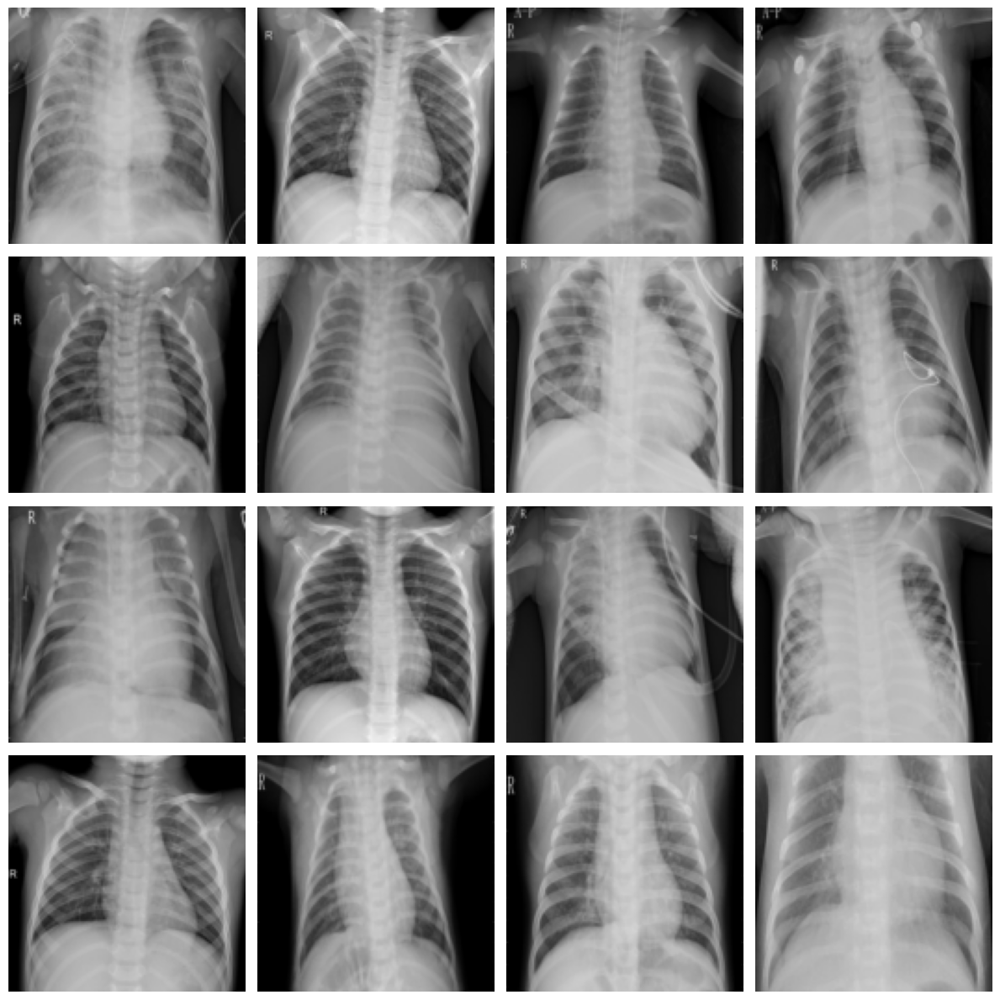

In [8]:
# Visualize a batch
def show_batch(loader, num_images=16):
    batch = next(iter(loader))

    fig, axes = plt.subplots(4, 4, figsize=(12, 12))
    axes = axes.flatten()

    for idx in range(min(num_images, len(batch))):
        img = batch[idx].cpu()
        img = img * 0.5 + 0.5  # Denormalize from [-1, 1] to [0, 1]
        img = img.permute(1, 2, 0).numpy()

        axes[idx].imshow(img)
        axes[idx].axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(base_dir, 'results', 'sample_batch.png'), dpi=150, bbox_inches='tight')
    plt.show()

show_batch(train_loader)

In [9]:
# PHASE 2 & 3: VAE Architecture and Implementation

class VAE(nn.Module):
    def __init__(self, img_channels=3, img_size=128, latent_dim=256):
        super(VAE, self).__init__()

        self.img_channels = img_channels
        self.img_size = img_size
        self.latent_dim = latent_dim

        # Encoder
        self.encoder = nn.Sequential(
            # Input: 3 x 128 x 128
            nn.Conv2d(img_channels, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # 32 x 64 x 64
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            # 64 x 32 x 32
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            # 128 x 16 x 16
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            # 256 x 8 x 8
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            # 512 x 4 x 4
        )

        # Flattened size after encoder
        self.flatten_size = 512 * 4 * 4

        # Latent space layers
        self.fc_mu = nn.Linear(self.flatten_size, latent_dim)
        self.fc_logvar = nn.Linear(self.flatten_size, latent_dim)

        # Decoder input
        self.fc_decode = nn.Linear(latent_dim, self.flatten_size)

        # Decoder
        self.decoder = nn.Sequential(
            # Input: 512 x 4 x 4
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            # 256 x 8 x 8
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            # 128 x 16 x 16
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            # 64 x 32 x 32
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # 32 x 64 x 64
            nn.ConvTranspose2d(32, img_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
            # Output: 3 x 128 x 128
        )

    def encode(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std
        return z

    def decode(self, z):
        x = self.fc_decode(z)
        x = x.view(x.size(0), 512, 4, 4)
        x = self.decoder(x)
        return x

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar

# Check model architecture
model = VAE(img_channels=3, img_size=img_size, latent_dim=256).to(device)
print(f"Model parameters: {sum(p.numel() for p in model.parameters()):,}")

Model parameters: 11,878,211


In [10]:
# Loss function
def vae_loss(recon_x, x, mu, logvar, beta=0.5):
    # Reconstruction loss (MSE)
    recon_loss = F.mse_loss(recon_x, x, reduction='sum')

    # KL divergence loss
    # KL(N(mu, sigma^2) || N(0, 1)) = -0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    kl_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    # Total loss
    total_loss = recon_loss + beta * kl_loss

    return total_loss, recon_loss, kl_loss

In [11]:
# Training components

# Hyperparameters
learning_rate = 5e-4
beta = 0.5
num_epochs = 100

# Optimizer
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Learning rate scheduler (optional but recommended)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

# Loss tracking
train_losses = []
recon_losses = []
kl_losses = []

print(f"Training configuration:")
print(f"  Image size: {img_size}x{img_size}")
print(f"  Latent dimension: {model.latent_dim}")
print(f"  Batch size: {batch_size}")
print(f"  Learning rate: {learning_rate}")
print(f"  Beta: {beta}")
print(f"  Epochs: {num_epochs}")

Training configuration:
  Image size: 128x128
  Latent dimension: 256
  Batch size: 32
  Learning rate: 0.0005
  Beta: 0.5
  Epochs: 100


In [12]:
# Checkpoint saving function
def save_checkpoint(model, optimizer, epoch, loss, filename):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss,
        'latent_dim': model.latent_dim,
        'img_size': model.img_size
    }
    torch.save(checkpoint, filename)

def load_checkpoint(model, optimizer, filename):
    checkpoint = torch.load(filename)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    loss = checkpoint['loss']
    return epoch, loss

In [13]:
# Test forward pass
test_batch = next(iter(train_loader))
test_input = test_batch[:4].to(device)

with torch.no_grad():
    recon, mu, logvar = model(test_input)
    loss, recon_loss, kl_loss = vae_loss(recon, test_input, mu, logvar, beta)

print(f"Test forward pass successful")
print(f"  Input shape: {test_input.shape}")
print(f"  Reconstruction shape: {recon.shape}")
print(f"  Latent mu shape: {mu.shape}")
print(f"  Total loss: {loss.item():.2f}")

Test forward pass successful
  Input shape: torch.Size([4, 3, 128, 128])
  Reconstruction shape: torch.Size([4, 3, 128, 128])
  Latent mu shape: torch.Size([4, 256])
  Total loss: 96021.70


In [14]:
# PHASE 4: Training Loop

def train_epoch(model, train_loader, optimizer, beta, device):
    model.train()
    train_loss = 0
    train_recon_loss = 0
    train_kl_loss = 0

    for batch_idx, data in enumerate(train_loader):
        data = data.to(device)

        optimizer.zero_grad()

        recon_batch, mu, logvar = model(data)
        loss, recon_loss, kl_loss = vae_loss(recon_batch, data, mu, logvar, beta)

        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_recon_loss += recon_loss.item()
        train_kl_loss += kl_loss.item()

    avg_loss = train_loss / len(train_loader.dataset)
    avg_recon = train_recon_loss / len(train_loader.dataset)
    avg_kl = train_kl_loss / len(train_loader.dataset)

    return avg_loss, avg_recon, avg_kl

def visualize_reconstruction(model, data_loader, epoch, save_dir, device, num_images=8):
    model.eval()
    with torch.no_grad():
        data = next(iter(data_loader))[:num_images].to(device)
        recon, _, _ = model(data)

        comparison = torch.cat([data, recon])
        comparison = comparison.cpu()
        comparison = comparison * 0.5 + 0.5

        grid = make_grid(comparison, nrow=num_images)
        save_image(grid, os.path.join(save_dir, f'reconstruction_epoch_{epoch}.png'))

def generate_samples(model, epoch, save_dir, device, num_samples=64):
    model.eval()
    with torch.no_grad():
        z = torch.randn(num_samples, model.latent_dim).to(device)
        samples = model.decode(z)
        samples = samples.cpu()
        samples = samples * 0.5 + 0.5

        grid = make_grid(samples, nrow=8)
        save_image(grid, os.path.join(save_dir, f'samples_epoch_{epoch}.png'))

# Training loop
results_dir = os.path.join(base_dir, 'results')
checkpoint_dir = os.path.join(base_dir, 'checkpoints')

print("Starting training...")
print("=" * 60)

for epoch in range(1, num_epochs + 1):
    avg_loss, avg_recon, avg_kl = train_epoch(model, train_loader, optimizer, beta, device)

    train_losses.append(avg_loss)
    recon_losses.append(avg_recon)
    kl_losses.append(avg_kl)

    scheduler.step(avg_loss)

    print(f"Epoch {epoch}/{num_epochs} | Loss: {avg_loss:.4f} | Recon: {avg_recon:.4f} | KL: {avg_kl:.4f}")

    if epoch % 10 == 0:
        visualize_reconstruction(model, test_loader, epoch, results_dir, device)
        generate_samples(model, epoch, results_dir, device)

        checkpoint_path = os.path.join(checkpoint_dir, f'vae_epoch_{epoch}.pt')
        save_checkpoint(model, optimizer, epoch, avg_loss, checkpoint_path)
        print(f"  Saved checkpoint and visualizations")

    if epoch % 25 == 0:
        print("-" * 60)

print("=" * 60)
print("Training completed!")

final_checkpoint = os.path.join(checkpoint_dir, 'vae_final.pt')
save_checkpoint(model, optimizer, num_epochs, train_losses[-1], final_checkpoint)
print(f"Final model saved to {final_checkpoint}")

Starting training...
Epoch 1/100 | Loss: 39090.3515 | Recon: 3657.8760 | KL: 70864.9519
Epoch 2/100 | Loss: 1732.0739 | Recon: 1528.1200 | KL: 407.9078
Epoch 3/100 | Loss: 1403.8705 | Recon: 1240.4869 | KL: 326.7672
Epoch 4/100 | Loss: 1253.0362 | Recon: 1103.1926 | KL: 299.6872
Epoch 5/100 | Loss: 1168.8809 | Recon: 1020.8285 | KL: 296.1048
Epoch 6/100 | Loss: 1106.9422 | Recon: 962.0140 | KL: 289.8564
Epoch 7/100 | Loss: 1033.9955 | Recon: 893.6782 | KL: 280.6347
Epoch 8/100 | Loss: 999.9579 | Recon: 861.2773 | KL: 277.3613
Epoch 9/100 | Loss: 961.8070 | Recon: 824.1817 | KL: 275.2507
Epoch 10/100 | Loss: 929.7832 | Recon: 795.6031 | KL: 268.3602
  Saved checkpoint and visualizations
Epoch 11/100 | Loss: 918.7371 | Recon: 783.0608 | KL: 271.3525
Epoch 12/100 | Loss: 892.3742 | Recon: 757.6714 | KL: 269.4057
Epoch 13/100 | Loss: 857.5555 | Recon: 726.2664 | KL: 262.5783
Epoch 14/100 | Loss: 842.7276 | Recon: 712.6736 | KL: 260.1079
Epoch 15/100 | Loss: 833.0845 | Recon: 702.6707 | KL:

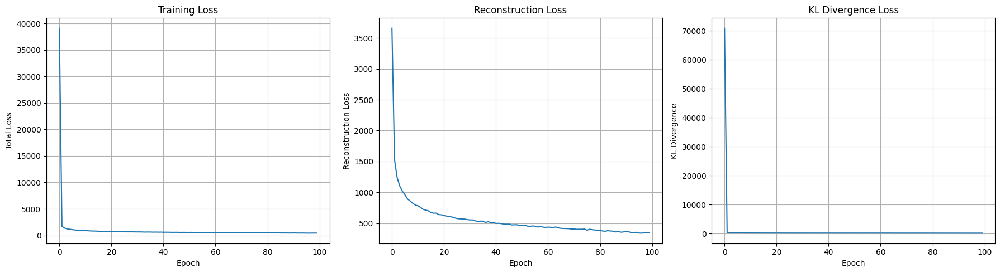

Training curves saved


In [15]:
# Plot training curves

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].plot(train_losses)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Total Loss')
axes[0].set_title('Training Loss')
axes[0].grid(True)

axes[1].plot(recon_losses)
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Reconstruction Loss')
axes[1].set_title('Reconstruction Loss')
axes[1].grid(True)

axes[2].plot(kl_losses)
axes[2].set_xlabel('Epoch')
axes[2].set_ylabel('KL Divergence')
axes[2].set_title('KL Divergence Loss')
axes[2].grid(True)

plt.tight_layout()
plt.savefig(os.path.join(results_dir, 'training_curves.png'), dpi=150, bbox_inches='tight')
plt.show()

print(f"Training curves saved")

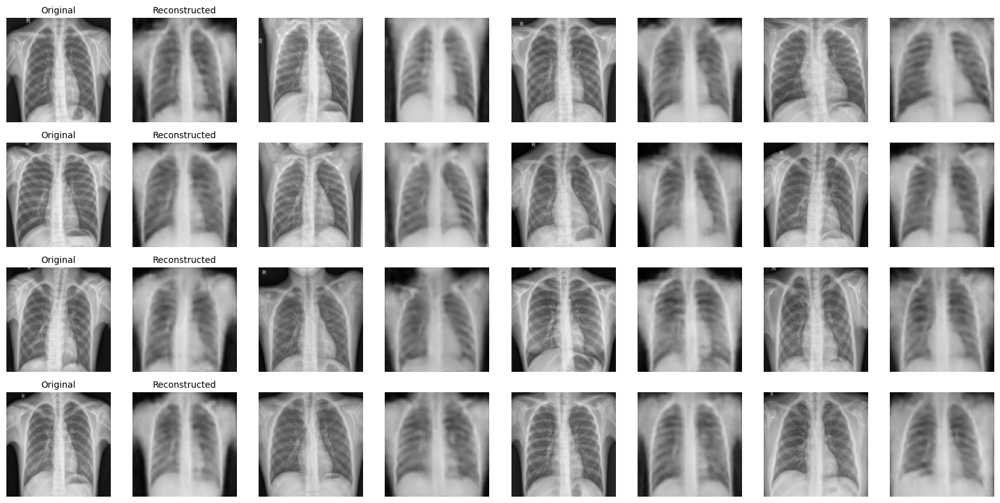

In [16]:
# Display final reconstruction comparison

model.eval()
with torch.no_grad():
    test_data = next(iter(test_loader))[:16].to(device)
    recon_data, _, _ = model(test_data)

fig, axes = plt.subplots(4, 8, figsize=(16, 8))

for i in range(16):
    # Original
    orig = test_data[i].cpu() * 0.5 + 0.5
    orig = orig.permute(1, 2, 0).numpy()
    axes[i//4, (i%4)*2].imshow(orig)
    axes[i//4, (i%4)*2].axis('off')
    if i % 4 == 0:
        axes[i//4, (i%4)*2].set_title('Original', fontsize=10)

    # Reconstruction
    recon = recon_data[i].cpu() * 0.5 + 0.5
    recon = recon.permute(1, 2, 0).numpy()
    axes[i//4, (i%4)*2+1].imshow(recon)
    axes[i//4, (i%4)*2+1].axis('off')
    if i % 4 == 0:
        axes[i//4, (i%4)*2+1].set_title('Reconstructed', fontsize=10)

plt.tight_layout()
plt.savefig(os.path.join(results_dir, 'final_reconstruction_comparison.png'), dpi=150, bbox_inches='tight')
plt.show()

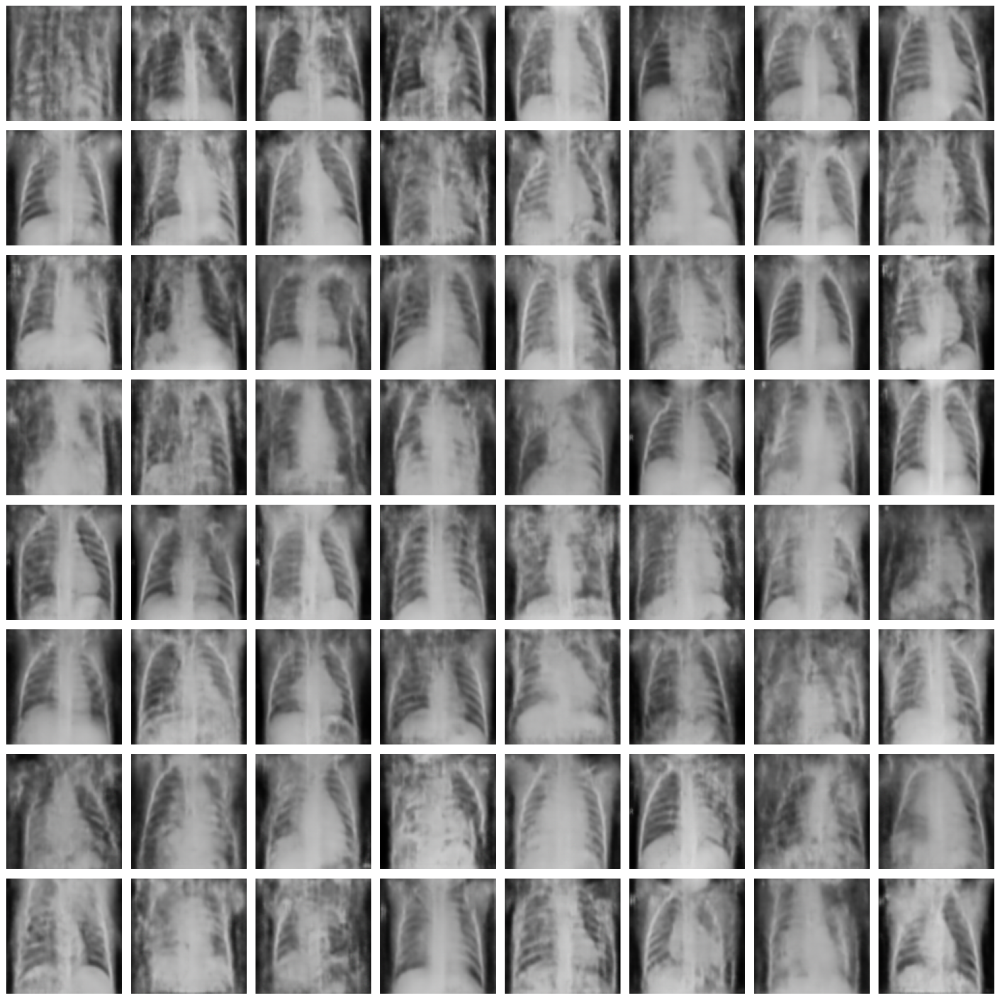

Generated samples saved


In [17]:
# Generate and display random samples

model.eval()
with torch.no_grad():
    z = torch.randn(64, model.latent_dim).to(device)
    samples = model.decode(z)
    samples = samples.cpu() * 0.5 + 0.5

fig, axes = plt.subplots(8, 8, figsize=(16, 16))
axes = axes.flatten()

for i in range(64):
    img = samples[i].permute(1, 2, 0).numpy()
    axes[i].imshow(img)
    axes[i].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(results_dir, 'generated_samples.png'), dpi=150, bbox_inches='tight')
plt.show()

print("Generated samples saved")

In [18]:
# PHASE 5: Evaluation

# Step 11: Generate large set of images for evaluation

def generate_images_for_evaluation(model, num_images, device):
    model.eval()
    generated_images = []

    batch_size = 64
    num_batches = (num_images + batch_size - 1) // batch_size

    with torch.no_grad():
        for _ in tqdm(range(num_batches), desc="Generating images"):
            current_batch_size = min(batch_size, num_images - len(generated_images) * batch_size)
            z = torch.randn(current_batch_size, model.latent_dim).to(device)
            samples = model.decode(z)
            generated_images.append(samples.cpu())

    generated_images = torch.cat(generated_images, dim=0)[:num_images]
    return generated_images

num_eval_images = 3000
generated_images = generate_images_for_evaluation(model, num_eval_images, device)

gen_img_dir = os.path.join(base_dir, 'generated_images')
for i in range(min(100, len(generated_images))):
    img = generated_images[i] * 0.5 + 0.5
    save_image(img, os.path.join(gen_img_dir, f'generated_{i:04d}.png'))

print(f"Generated {len(generated_images)} images for evaluation")

Generating images: 100%|██████████| 47/47 [00:01<00:00, 32.96it/s]


Generated 3000 images for evaluation


In [19]:
# CORRECT FID and IS Computation

from ignite.engine import Engine
from tqdm import tqdm

def interpolate_images(batch):
    arr = []
    for img in batch:
        img = img * 0.5 + 0.5
        img = torch.clamp(img, 0, 1)
        pil_img = transforms.ToPILImage()(img)
        resized_img = pil_img.resize((299, 299), Image.BILINEAR)
        arr.append(transforms.ToTensor()(resized_img))
    return torch.stack(arr)

# Collect real images from test set
print("Collecting real images...")
real_imgs = []
for batch in test_loader:
    real_imgs.append(batch)
    if len(torch.cat(real_imgs, dim=0)) >= num_eval_images:
        break
real_imgs = torch.cat(real_imgs, dim=0)[:num_eval_images]

# Match number of images
min_samples = min(len(real_imgs), len(generated_images))
real_imgs = real_imgs[:min_samples]
fake_imgs = generated_images[:min_samples]

print(f"Using {min_samples} images for evaluation")

# Dataset that returns (fake, real) pairs for FID
class FIDDataset(Dataset):
    def __init__(self, fake_images, real_images):
        self.fake_images = fake_images
        self.real_images = real_images

    def __len__(self):
        return len(self.fake_images)

    def __getitem__(self, idx):
        fake = interpolate_images(self.fake_images[idx:idx+1])[0]
        real = interpolate_images(self.real_images[idx:idx+1])[0]
        return fake, real

# Dataset that returns only fake images for IS
class ISDataset(Dataset):
    def __init__(self, fake_images):
        self.fake_images = fake_images

    def __len__(self):
        return len(self.fake_images)

    def __getitem__(self, idx):
        return interpolate_images(self.fake_images[idx:idx+1])[0]

# Create datasets
fid_dataset = FIDDataset(fake_imgs, real_imgs)
is_dataset = ISDataset(fake_imgs)

fid_loader = DataLoader(fid_dataset, batch_size=32, shuffle=False, num_workers=2)
is_loader = DataLoader(is_dataset, batch_size=32, shuffle=False, num_workers=2)

# Simple evaluation step
def eval_step(engine, batch):
    return batch

# Compute FID
print("\nComputing FID Score (this takes 5-10 minutes)...")
fid_evaluator = Engine(eval_step)
fid_metric = FID(device=device)
fid_metric.attach(fid_evaluator, "fid")

fid_evaluator.run(fid_loader)
fid_score = fid_evaluator.state.metrics['fid']

print(f"FID Score: {fid_score:.4f}")

# Compute IS
print("\nComputing Inception Score...")
is_evaluator = Engine(eval_step)
is_metric = InceptionScore(device=device, output_transform=lambda x: x)
is_metric.attach(is_evaluator, "is")

is_evaluator.run(is_loader)
is_score = is_evaluator.state.metrics['is']

print(f"Inception Score: {is_score:.4f}")

Using 624 images for evaluation

Computing FID Score (this takes 5-10 minutes)...
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:00<00:00, 132MB/s] 


FID Score: 0.1204

Computing Inception Score...
Inception Score: 1.6965


In [21]:
# Step 14: Prepare visual results

# Save final metrics
with open(os.path.join(results_dir, 'metrics.txt'), 'w') as f:
    f.write(f"FID Score: {fid_score:.4f}\n")
    f.write(f"Inception Score: {is_score:.4f}\n")
    f.write(f"Final Training Loss: {train_losses[-1]:.4f}\n")
    f.write(f"Final Reconstruction Loss: {recon_losses[-1]:.4f}\n")
    f.write(f"Final KL Loss: {kl_losses[-1]:.4f}\n")

print("\nFinal Metrics:")
print(f"  FID Score: {fid_score:.4f}")
print(f"  Inception Score: {is_score:.4f}")


Final Metrics:
  FID Score: 0.1204
  Inception Score: 1.6965


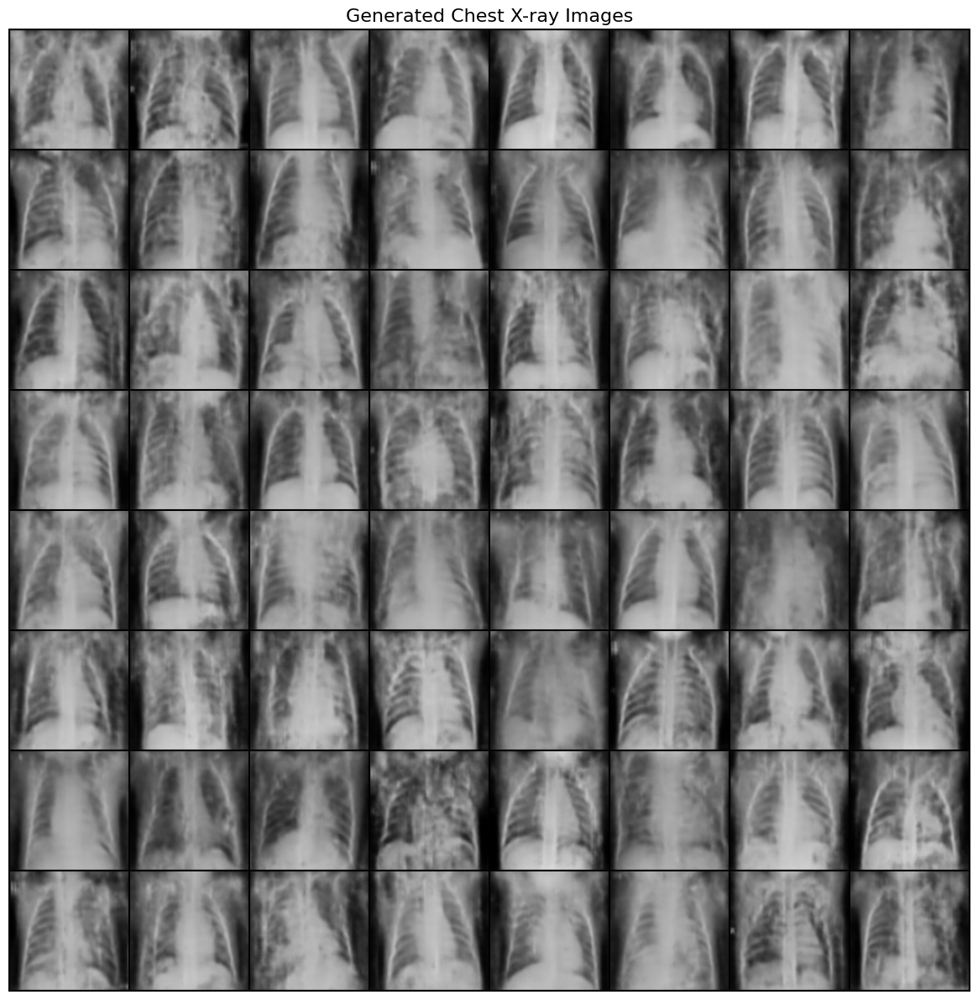

In [22]:
# Create high-quality grid of generated images (64 samples)

model.eval()
with torch.no_grad():
    z = torch.randn(64, model.latent_dim).to(device)
    samples = model.decode(z)
    samples = samples.cpu() * 0.5 + 0.5
    samples = torch.clamp(samples, 0, 1)

grid = make_grid(samples, nrow=8, padding=2)
save_image(grid, os.path.join(results_dir, 'generated_grid_final.png'))

plt.figure(figsize=(12, 12))
plt.imshow(grid.permute(1, 2, 0).numpy())
plt.axis('off')
plt.title('Generated Chest X-ray Images', fontsize=16)
plt.tight_layout()
plt.savefig(os.path.join(results_dir, 'generated_grid_display.png'), dpi=200, bbox_inches='tight')
plt.show()

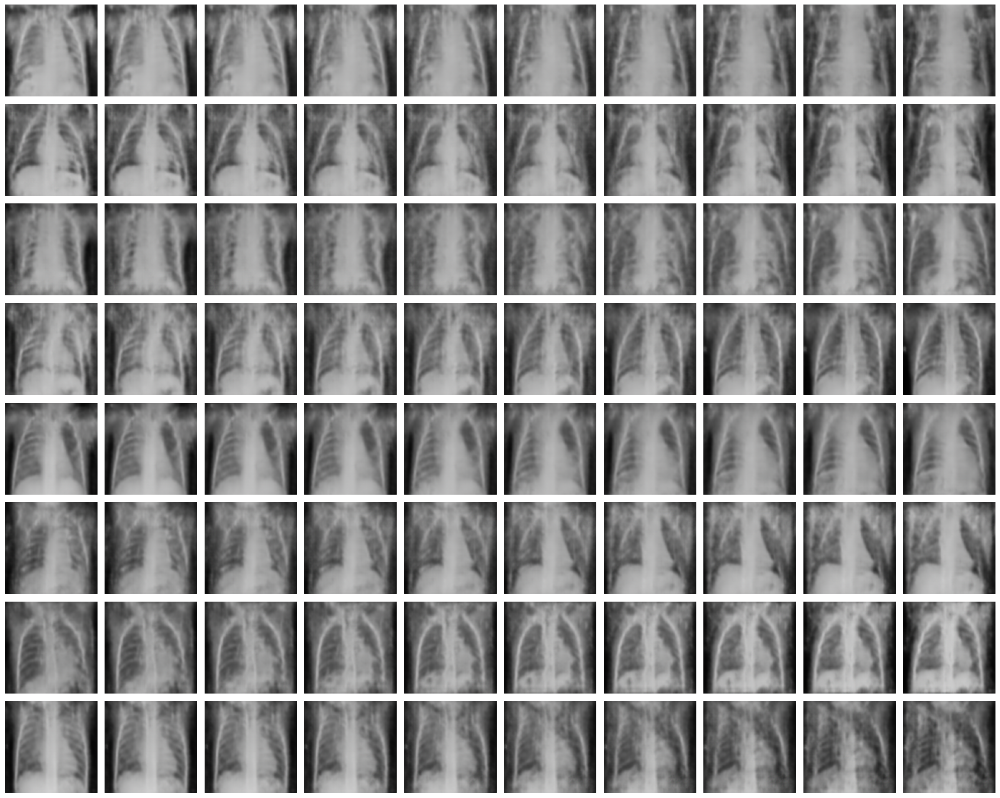

Latent space interpolations saved


In [23]:
# Latent space interpolation

def interpolate_latent_space(model, z1, z2, num_steps, device):
    model.eval()
    interpolations = []

    with torch.no_grad():
        for alpha in np.linspace(0, 1, num_steps):
            z = (1 - alpha) * z1 + alpha * z2
            sample = model.decode(z)
            interpolations.append(sample)

    return torch.cat(interpolations, dim=0)

# Generate interpolations between random points
num_interpolations = 8
num_steps = 10

fig, axes = plt.subplots(num_interpolations, num_steps, figsize=(20, 16))

with torch.no_grad():
    for i in range(num_interpolations):
        z1 = torch.randn(1, model.latent_dim).to(device)
        z2 = torch.randn(1, model.latent_dim).to(device)

        interpolated = interpolate_latent_space(model, z1, z2, num_steps, device)
        interpolated = interpolated.cpu() * 0.5 + 0.5
        interpolated = torch.clamp(interpolated, 0, 1)

        for j in range(num_steps):
            img = interpolated[j].permute(1, 2, 0).numpy()
            axes[i, j].imshow(img)
            axes[i, j].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(results_dir, 'latent_interpolations.png'), dpi=150, bbox_inches='tight')
plt.show()

print("Latent space interpolations saved")

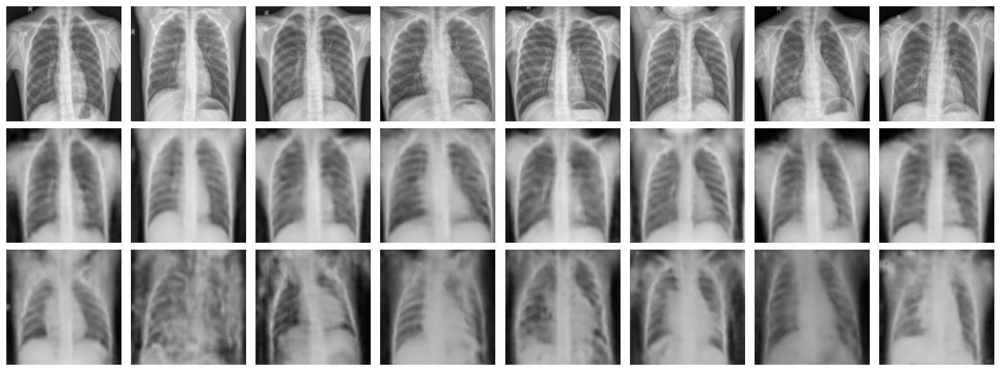

Comparison figure saved for report


In [24]:
# Create comparison figure for report (Real vs Reconstructed vs Generated)

fig, axes = plt.subplots(3, 8, figsize=(16, 6))

model.eval()
with torch.no_grad():
    test_batch = next(iter(test_loader))[:8].to(device)
    recon_batch, _, _ = model(test_batch)

    z_random = torch.randn(8, model.latent_dim).to(device)
    gen_batch = model.decode(z_random)

# Real images
for i in range(8):
    img = test_batch[i].cpu() * 0.5 + 0.5
    img = torch.clamp(img, 0, 1)
    img = img.permute(1, 2, 0).numpy()
    axes[0, i].imshow(img)
    axes[0, i].axis('off')
    if i == 0:
        axes[0, i].set_ylabel('Real', fontsize=12, rotation=0, labelpad=30)

# Reconstructed images
for i in range(8):
    img = recon_batch[i].cpu() * 0.5 + 0.5
    img = torch.clamp(img, 0, 1)
    img = img.permute(1, 2, 0).numpy()
    axes[1, i].imshow(img)
    axes[1, i].axis('off')
    if i == 0:
        axes[1, i].set_ylabel('Reconstructed', fontsize=12, rotation=0, labelpad=30)

# Generated images
for i in range(8):
    img = gen_batch[i].cpu() * 0.5 + 0.5
    img = torch.clamp(img, 0, 1)
    img = img.permute(1, 2, 0).numpy()
    axes[2, i].imshow(img)
    axes[2, i].axis('off')
    if i == 0:
        axes[2, i].set_ylabel('Generated', fontsize=12, rotation=0, labelpad=30)

plt.tight_layout()
plt.savefig(os.path.join(results_dir, 'comparison_real_recon_gen.png'), dpi=200, bbox_inches='tight')
plt.show()

print("Comparison figure saved for report")

In [25]:
# Summary of all results

print("\n" + "="*60)
print("EVALUATION SUMMARY")
print("="*60)
print(f"\nModel Configuration:")
print(f"  Image size: {img_size}x{img_size}")
print(f"  Latent dimension: {model.latent_dim}")
print(f"  Training epochs: {num_epochs}")
print(f"  Batch size: {batch_size}")
print(f"  Learning rate: {learning_rate}")
print(f"  Beta (KL weight): {beta}")

print(f"\nFinal Training Metrics:")
print(f"  Total Loss: {train_losses[-1]:.4f}")
print(f"  Reconstruction Loss: {recon_losses[-1]:.4f}")
print(f"  KL Divergence: {kl_losses[-1]:.4f}")

print(f"\nEvaluation Metrics:")
print(f"  FID Score: {fid_score:.4f} (lower is better)")
print(f"  Inception Score: {is_score:.4f} (higher is better)")

print(f"\nGenerated Outputs:")
print(f"  Total generated images: {num_eval_images}")
print(f"  Saved visualizations: {results_dir}")
print(f"  Saved checkpoints: {checkpoint_dir}")

print("="*60)


EVALUATION SUMMARY

Model Configuration:
  Image size: 128x128
  Latent dimension: 256
  Training epochs: 100
  Batch size: 32
  Learning rate: 0.0005
  Beta (KL weight): 0.5

Final Training Metrics:
  Total Loss: 452.7519
  Reconstruction Loss: 345.0627
  KL Divergence: 215.3783

Evaluation Metrics:
  FID Score: 0.1204 (lower is better)
  Inception Score: 1.6965 (higher is better)

Generated Outputs:
  Total generated images: 3000
  Saved visualizations: /content/drive/MyDrive/VAE_ChestXray/results
  Saved checkpoints: /content/drive/MyDrive/VAE_ChestXray/checkpoints
